In [2]:
import json
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader

import pretty_midi
from IPython.display import Audio, display


# ============================================================
# JSB Chorales Data Processor
# ============================================================

class JSBChoralesProcessor:
    def __init__(self, repo_dir="./JSB-Chorales-dataset", filename="Jsb16thSeparated.json"):
        self.repo_dir = Path(repo_dir)
        self.json_path = self.repo_dir / filename

        if not self.json_path.exists():
            raise FileNotFoundError(f"Cannot find {self.json_path}")

        with open(self.json_path, "r") as f:
            self.data = json.load(f)

        self.train = self.data["train"]
        self.valid = self.data["valid"]
        self.test = self.data["test"]

        self.voice_names = ["Soprano", "Alto", "Tenor", "Bass"]

        print("Loaded JSB Chorales")
        print("Train:", len(self.train))
        print("Valid:", len(self.valid))
        print("Test:", len(self.test))

    def get_split(self, split="train"):
        if split == "train":
            return self.train
        elif split == "valid":
            return self.valid
        elif split == "test":
            return self.test
        else:
            raise ValueError("split must be train, valid, or test")

    def summarize(self):
        for split in ["train", "valid", "test"]:
            seqs = self.get_split(split)
            lengths = [len(seq) for seq in seqs]

            pitches = []
            for seq in seqs:
                for chord in seq:
                    for p in chord:
                        if p != -1:
                            pitches.append(p)

            print(f"\n===== {split} =====")
            print("num chorales:", len(seqs))
            print("min length:", min(lengths))
            print("max length:", max(lengths))
            print("mean length:", np.mean(lengths))
            print("pitch min:", min(pitches))
            print("pitch max:", max(pitches))
            print("num notes:", len(pitches))

    def plot_length_distribution(self, split="train"):
        seqs = self.get_split(split)
        lengths = [len(seq) for seq in seqs]

        plt.figure(figsize=(6, 4))
        plt.hist(lengths, bins=30)
        plt.xlabel("Sequence length")
        plt.ylabel("Count")
        plt.title(f"JSB Chorale Length Distribution ({split})")
        plt.show()

    def plot_chorale(self, seq, title="JSB Chorale"):
        arr = np.array(seq)  # [T, 4]

        plt.figure(figsize=(12, 4))

        for v in range(4):
            pitches = arr[:, v]
            t = np.arange(len(pitches))
            mask = pitches != -1
            plt.scatter(t[mask], pitches[mask], s=8, label=self.voice_names[v])

        plt.xlabel("Time step")
        plt.ylabel("MIDI pitch")
        plt.title(title)
        plt.legend()
        plt.show()

    def chorale_to_pretty_midi(self, seq, tempo=90, step_duration=0.25):
        """
        seq: list of [Soprano, Alto, Tenor, Bass]
        step_duration=0.25 means each time step is a 16th note.
        """
        pm = pretty_midi.PrettyMIDI(initial_tempo=tempo)

        arr = np.array(seq)
        T = arr.shape[0]

        for v in range(4):
            program = pretty_midi.instrument_name_to_program("Acoustic Grand Piano")
            inst = pretty_midi.Instrument(program=program, name=self.voice_names[v])

            t = 0
            while t < T:
                pitch = int(arr[t, v])

                if pitch == -1:
                    t += 1
                    continue

                start = t
                end = t + 1

                # Merge repeated same pitch into one longer note
                while end < T and int(arr[end, v]) == pitch:
                    end += 1

                note = pretty_midi.Note(
                    velocity=90,
                    pitch=pitch,
                    start=start * step_duration,
                    end=end * step_duration,
                )

                inst.notes.append(note)
                t = end

            pm.instruments.append(inst)

        return pm

    def play_chorale(self, seq, fs=22050):
        pm = self.chorale_to_pretty_midi(seq)
        audio = pm.synthesize(fs=fs)

        audio = audio / (np.max(np.abs(audio)) + 1e-8)
        audio = audio * 0.8

        display(Audio(audio, rate=fs))
        return audio

    def save_chorale_midi(self, seq, path):
        path = Path(path)
        path.parent.mkdir(parents=True, exist_ok=True)

        pm = self.chorale_to_pretty_midi(seq)
        pm.write(str(path))

        print("Saved MIDI:", path)


# ============================================================
# Task 1 Dataset: Symbolic Unconditioned Generation
# ============================================================

PAD = "<PAD>"
BOS = "<BOS>"
EOS = "<EOS>"
UNK = "<UNK>"


class JSBUnconditionedDataset(Dataset):
    """
    Each timestep is a full 4-voice chord token:
    [Soprano, Alto, Tenor, Bass]

    Input:
        BOS, chord_1, chord_2, ...
    Target:
        chord_1, chord_2, ..., EOS
    """

    def __init__(self, seqs, chord_vocab=None):
        self.seqs = seqs

        if chord_vocab is None:
            self.chord_vocab, self.id_to_chord = self.build_chord_vocab(seqs)
        else:
            self.chord_vocab = chord_vocab
            self.id_to_chord = {v: k for k, v in chord_vocab.items()}

        self.samples = []

        for seq in seqs:
            ids = [self.chord_vocab[BOS]]

            for chord in seq:
                key = tuple(chord)
                ids.append(self.chord_vocab.get(key, self.chord_vocab[UNK]))

            ids.append(self.chord_vocab[EOS])

            ids = torch.tensor(ids, dtype=torch.long)
            self.samples.append(ids)

    def build_chord_vocab(self, seqs):
        vocab = {
            PAD: 0,
            BOS: 1,
            EOS: 2,
            UNK: 3,
        }

        for seq in seqs:
            for chord in seq:
                key = tuple(chord)
                if key not in vocab:
                    vocab[key] = len(vocab)

        id_to_chord = {v: k for k, v in vocab.items()}
        return vocab, id_to_chord

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        ids = self.samples[idx]
        x = ids[:-1]
        y = ids[1:]
        return x, y


def collate_unconditioned(batch, pad_id=0):
    xs, ys = zip(*batch)
    max_len = max(len(x) for x in xs)
    batch_size = len(xs)

    x_pad = torch.full((batch_size, max_len), pad_id, dtype=torch.long)
    y_pad = torch.full((batch_size, max_len), pad_id, dtype=torch.long)

    for i, (x, y) in enumerate(zip(xs, ys)):
        x_pad[i, :len(x)] = x
        y_pad[i, :len(y)] = y

    return x_pad, y_pad


# ============================================================
# Task 2 Dataset: Soprano-conditioned Harmonization
# ============================================================

class JSBHarmonizationDataset(Dataset):
    """
    Input:
        Soprano pitch sequence

    Target:
        ATB token sequence = [Alto, Tenor, Bass]
    """

    def __init__(self, seqs, pitch_vocab=None, atb_vocab=None):
        self.seqs = seqs

        if pitch_vocab is None:
            self.pitch_vocab, self.id_to_pitch = self.build_pitch_vocab(seqs)
        else:
            self.pitch_vocab = pitch_vocab
            self.id_to_pitch = {v: k for k, v in pitch_vocab.items()}

        if atb_vocab is None:
            self.atb_vocab, self.id_to_atb = self.build_atb_vocab(seqs)
        else:
            self.atb_vocab = atb_vocab
            self.id_to_atb = {v: k for k, v in atb_vocab.items()}

        self.samples = []

        for seq in seqs:
            soprano_ids = []
            atb_ids = []

            for chord in seq:
                s = chord[0]
                atb = tuple(chord[1:4])

                soprano_ids.append(self.pitch_vocab.get(s, self.pitch_vocab[UNK]))
                atb_ids.append(self.atb_vocab.get(atb, self.atb_vocab[UNK]))

            soprano_ids = torch.tensor(soprano_ids, dtype=torch.long)
            atb_ids = torch.tensor(atb_ids, dtype=torch.long)

            self.samples.append((soprano_ids, atb_ids))

    def build_pitch_vocab(self, seqs):
        vocab = {
            PAD: 0,
            UNK: 1,
        }

        pitches = set()

        for seq in seqs:
            for chord in seq:
                for p in chord:
                    pitches.add(p)

        for p in sorted(pitches):
            if p not in vocab:
                vocab[p] = len(vocab)

        id_to_pitch = {v: k for k, v in vocab.items()}
        return vocab, id_to_pitch

    def build_atb_vocab(self, seqs):
        vocab = {
            PAD: 0,
            UNK: 1,
        }

        for seq in seqs:
            for chord in seq:
                atb = tuple(chord[1:4])
                if atb not in vocab:
                    vocab[atb] = len(vocab)

        id_to_atb = {v: k for k, v in vocab.items()}
        return vocab, id_to_atb

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]


def collate_harmonization(batch, pitch_pad_id=0, atb_pad_id=0):
    xs, ys = zip(*batch)
    max_len = max(len(x) for x in xs)
    batch_size = len(xs)

    x_pad = torch.full((batch_size, max_len), pitch_pad_id, dtype=torch.long)
    y_pad = torch.full((batch_size, max_len), atb_pad_id, dtype=torch.long)

    for i, (x, y) in enumerate(zip(xs, ys)):
        x_pad[i, :len(x)] = x
        y_pad[i, :len(y)] = y

    return x_pad, y_pad

Loaded JSB Chorales
Train: 229
Valid: 76
Test: 77

===== train =====
num chorales: 229
min length: 100
max length: 516
mean length: 241.1703056768559
pitch min: 36
pitch max: 81
num notes: 220501

===== valid =====
num chorales: 76
min length: 128
max length: 576
mean length: 242.21052631578948
pitch min: 36
pitch max: 81
num notes: 73043

===== test =====
num chorales: 77
min length: 128
max length: 640
mean length: 245.45454545454547
pitch min: 36
pitch max: 81
num notes: 75316


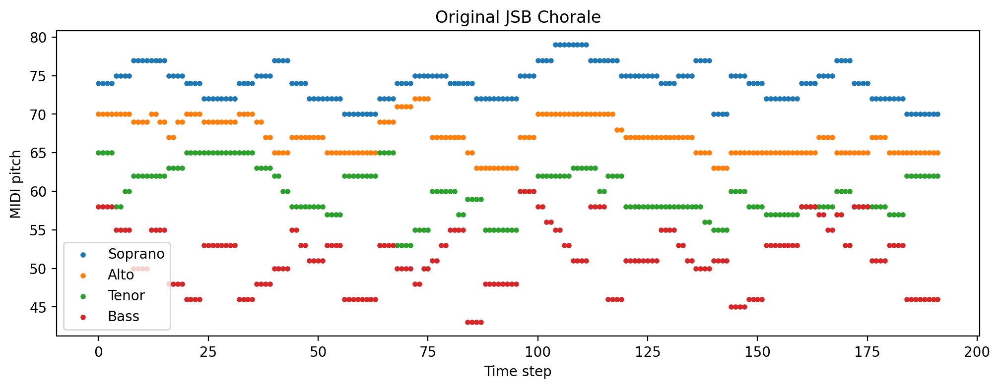

Saved MIDI: jsb_outputs\original_example.mid


In [3]:
# Load processor
processor = JSBChoralesProcessor(
    repo_dir="./JSB-Chorales-dataset",
    filename="Jsb16thSeparated.json"
)

processor.summarize()

# Pick one chorale
seq = processor.train[0]

# Plot
processor.plot_chorale(seq, title="Original JSB Chorale")

# Play directly in notebook
audio = processor.play_chorale(seq)

# Save MIDI for later submission / checking
processor.save_chorale_midi(seq, "./jsb_outputs/original_example.mid")

In [4]:
# Task 1 dataset
train_task1 = JSBUnconditionedDataset(processor.train)
valid_task1 = JSBUnconditionedDataset(
    processor.valid,
    chord_vocab=train_task1.chord_vocab
)

train_loader_task1 = DataLoader(
    train_task1,
    batch_size=16,
    shuffle=True,
    collate_fn=lambda batch: collate_unconditioned(
        batch,
        pad_id=train_task1.chord_vocab[PAD]
    )
)

x1, y1 = next(iter(train_loader_task1))

print("Task 1 x shape:", x1.shape)
print("Task 1 y shape:", y1.shape)
print("Chord vocab size:", len(train_task1.chord_vocab))


# Task 2 dataset
train_task2 = JSBHarmonizationDataset(processor.train)
valid_task2 = JSBHarmonizationDataset(
    processor.valid,
    pitch_vocab=train_task2.pitch_vocab,
    atb_vocab=train_task2.atb_vocab
)

train_loader_task2 = DataLoader(
    train_task2,
    batch_size=16,
    shuffle=True,
    collate_fn=lambda batch: collate_harmonization(
        batch,
        pitch_pad_id=train_task2.pitch_vocab[PAD],
        atb_pad_id=train_task2.atb_vocab[PAD]
    )
)

x2, y2 = next(iter(train_loader_task2))

print("Task 2 x shape:", x2.shape)
print("Task 2 y shape:", y2.shape)
print("Pitch vocab size:", len(train_task2.pitch_vocab))
print("ATB vocab size:", len(train_task2.atb_vocab))

Task 1 x shape: torch.Size([16, 409])
Task 1 y shape: torch.Size([16, 409])
Chord vocab size: 4374
Task 2 x shape: torch.Size([16, 480])
Task 2 y shape: torch.Size([16, 480])
Pitch vocab size: 49
ATB vocab size: 1956


# Transformer Model

In [5]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import numpy as np
from pathlib import Path


class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=2048):
        super().__init__()

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).float().unsqueeze(1)

        div_term = torch.exp(
            torch.arange(0, d_model, 2).float()
            * (-math.log(10000.0) / d_model)
        )

        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)

        self.register_buffer("pe", pe.unsqueeze(0))  # [1, max_len, d_model]

    def forward(self, x):
        """
        x: [B, T, D]
        """
        T = x.size(1)
        return x + self.pe[:, :T, :]


class ChoraleTransformerLM(nn.Module):
    def __init__(
        self,
        vocab_size,
        pad_id,
        d_model=256,
        n_heads=4,
        n_layers=4,
        dim_feedforward=512,
        dropout=0.1,
        max_len=2048,
    ):
        super().__init__()

        self.vocab_size = vocab_size
        self.pad_id = pad_id
        self.d_model = d_model

        self.token_emb = nn.Embedding(
            vocab_size,
            d_model,
            padding_idx=pad_id
        )

        self.pos_emb = PositionalEncoding(d_model, max_len=max_len)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True,
            activation="gelu",
            norm_first=True,
        )

        self.transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=n_layers
        )

        self.ln = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, vocab_size)

    def make_causal_mask(self, T, device):
        """
        True means masked position.
        """
        mask = torch.triu(
            torch.ones(T, T, device=device, dtype=torch.bool),
            diagonal=1
        )
        return mask

    def forward(self, x):
        """
        x: [B, T]
        return logits: [B, T, vocab_size]
        """
        B, T = x.shape
        device = x.device

        causal_mask = self.make_causal_mask(T, device)

        key_padding_mask = x.eq(self.pad_id)  # [B, T]

        h = self.token_emb(x) * math.sqrt(self.d_model)
        h = self.pos_emb(h)

        h = self.transformer(
            h,
            mask=causal_mask,
            src_key_padding_mask=key_padding_mask,
        )

        h = self.ln(h)
        logits = self.head(h)

        return logits

In [6]:
class ChoraleGenerationPipeline:
    def __init__(
        self,
        train_dataset,
        valid_dataset,
        train_loader,
        valid_loader,
        processor,
        output_dir="./jsb_transformer_outputs",
        device=None,
        d_model=256,
        n_heads=4,
        n_layers=4,
        lr=3e-4,
    ):
        self.train_dataset = train_dataset
        self.valid_dataset = valid_dataset
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.processor = processor

        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)

        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")

        self.chord_vocab = train_dataset.chord_vocab
        self.id_to_chord = train_dataset.id_to_chord

        self.pad_id = self.chord_vocab[PAD]
        self.bos_id = self.chord_vocab[BOS]
        self.eos_id = self.chord_vocab[EOS]
        self.unk_id = self.chord_vocab[UNK]

        self.model = ChoraleTransformerLM(
            vocab_size=len(self.chord_vocab),
            pad_id=self.pad_id,
            d_model=d_model,
            n_heads=n_heads,
            n_layers=n_layers,
            dim_feedforward=d_model * 4,
            dropout=0.1,
        ).to(self.device)

        self.optimizer = torch.optim.AdamW(
            self.model.parameters(),
            lr=lr,
            weight_decay=1e-4
        )

        self.criterion = nn.CrossEntropyLoss(
            ignore_index=self.pad_id
        )

        print("Device:", self.device)
        print("Vocab size:", len(self.chord_vocab))
        print("Model parameters:", sum(p.numel() for p in self.model.parameters()) / 1e6, "M")

    def train(self, epochs=30, save_every=5):
        best_val_loss = float("inf")

        for epoch in range(1, epochs + 1):
            train_loss = self.train_one_epoch(epoch, epochs)
            val_loss = self.evaluate()

            print(
                f"Epoch {epoch}/{epochs} | "
                f"train_loss={train_loss:.4f} | "
                f"val_loss={val_loss:.4f} | "
                f"val_ppl={math.exp(min(val_loss, 20)):.2f}"
            )

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                self.save_checkpoint("best_task1_transformer.pt")

            if epoch % save_every == 0:
                self.save_checkpoint(f"epoch_{epoch}_task1_transformer.pt")

        self.save_checkpoint("last_task1_transformer.pt")

    def train_one_epoch(self, epoch, total_epochs):
        self.model.train()
        losses = []

        pbar = tqdm(
            self.train_loader,
            desc=f"Train Epoch {epoch}/{total_epochs}"
        )

        for x, y in pbar:
            x = x.to(self.device)
            y = y.to(self.device)

            logits = self.model(x)

            loss = self.criterion(
                logits.reshape(-1, logits.size(-1)),
                y.reshape(-1)
            )

            self.optimizer.zero_grad(set_to_none=True)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)

            self.optimizer.step()

            losses.append(loss.item())
            pbar.set_postfix(loss=np.mean(losses))

        return float(np.mean(losses))

    @torch.no_grad()
    def evaluate(self):
        self.model.eval()
        losses = []

        for x, y in self.valid_loader:
            x = x.to(self.device)
            y = y.to(self.device)

            logits = self.model(x)

            loss = self.criterion(
                logits.reshape(-1, logits.size(-1)),
                y.reshape(-1)
            )

            losses.append(loss.item())

        return float(np.mean(losses))

    def save_checkpoint(self, filename):
        path = self.output_dir / filename

        torch.save(
            {
                "model": self.model.state_dict(),
                "optimizer": self.optimizer.state_dict(),
                "chord_vocab": self.chord_vocab,
                "id_to_chord": self.id_to_chord,
                "pad_id": self.pad_id,
                "bos_id": self.bos_id,
                "eos_id": self.eos_id,
                "unk_id": self.unk_id,
            },
            path
        )

        print("Saved:", path)

    def load_checkpoint(self, path):
        ckpt = torch.load(path, map_location=self.device)

        self.model.load_state_dict(ckpt["model"])

        if "optimizer" in ckpt:
            self.optimizer.load_state_dict(ckpt["optimizer"])

        print("Loaded:", path)

    @torch.no_grad()
    def generate_ids(
        self,
        max_len=256,
        temperature=1.0,
        top_k=20,
    ):
        self.model.eval()

        ids = [self.bos_id]

        for _ in range(max_len):
            x = torch.tensor(ids, dtype=torch.long, device=self.device).unsqueeze(0)

            logits = self.model(x)
            next_logits = logits[0, -1, :]

            # 不采样 PAD/BOS/UNK
            next_logits[self.pad_id] = -float("inf")
            next_logits[self.bos_id] = -float("inf")
            next_logits[self.unk_id] = -float("inf")

            next_logits = next_logits / max(temperature, 1e-8)

            if top_k is not None:
                values, indices = torch.topk(next_logits, k=top_k)
                probs = F.softmax(values, dim=-1)
                sampled_idx = torch.multinomial(probs, num_samples=1)
                next_id = indices[sampled_idx].item()
            else:
                probs = F.softmax(next_logits, dim=-1)
                next_id = torch.multinomial(probs, num_samples=1).item()

            if next_id == self.eos_id:
                break

            ids.append(next_id)

        return ids

    def ids_to_chorale(self, ids):
        seq = []

        for token_id in ids:
            if token_id in [self.bos_id, self.eos_id, self.pad_id, self.unk_id]:
                continue

            chord = self.id_to_chord.get(int(token_id), None)

            if chord is None:
                continue

            if isinstance(chord, str):
                continue

            seq.append([int(chord[0]), int(chord[1]), int(chord[2]), int(chord[3])])

        return seq

    def generate_chorale(
        self,
        max_len=256,
        temperature=0.9,
        top_k=20,
        save_name="symbolic_unconditioned.mid",
        play=True,
    ):
        ids = self.generate_ids(
            max_len=max_len,
            temperature=temperature,
            top_k=top_k,
        )

        seq = self.ids_to_chorale(ids)

        print("Generated length:", len(seq))

        if len(seq) == 0:
            print("Generated empty sequence. Try higher temperature or larger max_len.")
            return None

        self.processor.plot_chorale(
            seq,
            title="Generated Unconditioned Chorale"
        )

        midi_path = self.output_dir / save_name
        self.processor.save_chorale_midi(seq, midi_path)

        if play:
            self.processor.play_chorale(seq)

        return seq, midi_path

In [8]:
processor = JSBChoralesProcessor(
    repo_dir="./JSB-Chorales-dataset",
    filename="Jsb16thSeparated.json"
)

train_task1 = JSBUnconditionedDataset(processor.train)
valid_task1 = JSBUnconditionedDataset(
    processor.valid,
    chord_vocab=train_task1.chord_vocab
)

train_loader_task1 = DataLoader(
    train_task1,
    batch_size=16,
    shuffle=True,
    collate_fn=lambda batch: collate_unconditioned(
        batch,
        pad_id=train_task1.chord_vocab[PAD]
    )
)

valid_loader_task1 = DataLoader(
    valid_task1,
    batch_size=16,
    shuffle=False,
    collate_fn=lambda batch: collate_unconditioned(
        batch,
        pad_id=train_task1.chord_vocab[PAD]
    )
)

Loaded JSB Chorales
Train: 229
Valid: 76
Test: 77


In [13]:
task1_pipeline = ChoraleGenerationPipeline(
    train_dataset=train_task1,
    valid_dataset=valid_task1,
    train_loader=train_loader_task1,
    valid_loader=valid_loader_task1,
    processor=processor,
    output_dir="./jsb_transformer_outputs",
    d_model=256,
    n_heads=4,
    n_layers=4,
    lr=3e-4,
)

task1_pipeline.train(
    epochs=50,
    save_every=100
)

C:\Users\wleun\AppData\Local\Temp\ipykernel_7248\1153663842.py:71: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(


Device: cuda
Vocab size: 4374
Model parameters: 5.403414 M


Train Epoch 1/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 19.68it/s, loss=8.29]


Epoch 1/50 | train_loss=8.2874 | val_loss=7.9920 | val_ppl=2957.22
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 2/50: 100%|██████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.09it/s, loss=7.7]


Epoch 2/50 | train_loss=7.6963 | val_loss=7.4253 | val_ppl=1677.86
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 3/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 26.11it/s, loss=7.04]


Epoch 3/50 | train_loss=7.0382 | val_loss=6.8322 | val_ppl=927.24
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 4/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.40it/s, loss=6.38]


Epoch 4/50 | train_loss=6.3783 | val_loss=6.3069 | val_ppl=548.37
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 5/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 30.05it/s, loss=5.77]


Epoch 5/50 | train_loss=5.7706 | val_loss=5.8766 | val_ppl=356.58
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 6/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.28it/s, loss=5.34]


Epoch 6/50 | train_loss=5.3437 | val_loss=5.5612 | val_ppl=260.14
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 7/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 31.27it/s, loss=5.01]


Epoch 7/50 | train_loss=5.0103 | val_loss=5.3162 | val_ppl=203.60
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 8/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.57it/s, loss=4.71]


Epoch 8/50 | train_loss=4.7117 | val_loss=5.1140 | val_ppl=166.33
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 9/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.19it/s, loss=4.47]


Epoch 9/50 | train_loss=4.4688 | val_loss=4.9345 | val_ppl=139.01
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 10/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.77it/s, loss=4.24]


Epoch 10/50 | train_loss=4.2407 | val_loss=4.7801 | val_ppl=119.12
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 11/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.11it/s, loss=4.05]


Epoch 11/50 | train_loss=4.0488 | val_loss=4.6486 | val_ppl=104.44
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 12/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.99it/s, loss=3.86]


Epoch 12/50 | train_loss=3.8639 | val_loss=4.5367 | val_ppl=93.38
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 13/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.34it/s, loss=3.72]


Epoch 13/50 | train_loss=3.7161 | val_loss=4.4285 | val_ppl=83.80
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 14/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.76it/s, loss=3.6]


Epoch 14/50 | train_loss=3.5968 | val_loss=4.3348 | val_ppl=76.31
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 15/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.79it/s, loss=3.45]


Epoch 15/50 | train_loss=3.4515 | val_loss=4.2550 | val_ppl=70.46
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 16/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.86it/s, loss=3.32]


Epoch 16/50 | train_loss=3.3206 | val_loss=4.1826 | val_ppl=65.54
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 17/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.94it/s, loss=3.24]


Epoch 17/50 | train_loss=3.2394 | val_loss=4.1087 | val_ppl=60.87
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 18/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.76it/s, loss=3.12]


Epoch 18/50 | train_loss=3.1192 | val_loss=4.0478 | val_ppl=57.27
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 19/50: 100%|███████████████████████████████████████████████████████| 15/15 [00:00<00:00, 30.48it/s, loss=3]


Epoch 19/50 | train_loss=3.0028 | val_loss=3.9931 | val_ppl=54.23
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 20/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.88it/s, loss=2.91]


Epoch 20/50 | train_loss=2.9086 | val_loss=3.9425 | val_ppl=51.55
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 21/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.94it/s, loss=2.82]


Epoch 21/50 | train_loss=2.8155 | val_loss=3.8955 | val_ppl=49.18
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 22/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.29it/s, loss=2.76]


Epoch 22/50 | train_loss=2.7588 | val_loss=3.8558 | val_ppl=47.27
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 23/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.70it/s, loss=2.66]


Epoch 23/50 | train_loss=2.6591 | val_loss=3.8157 | val_ppl=45.41
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 24/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 30.10it/s, loss=2.58]


Epoch 24/50 | train_loss=2.5785 | val_loss=3.7848 | val_ppl=44.03
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 25/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.49it/s, loss=2.51]


Epoch 25/50 | train_loss=2.5122 | val_loss=3.7530 | val_ppl=42.65
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 26/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.03it/s, loss=2.44]


Epoch 26/50 | train_loss=2.4368 | val_loss=3.7261 | val_ppl=41.52
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 27/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.79it/s, loss=2.37]


Epoch 27/50 | train_loss=2.3737 | val_loss=3.6931 | val_ppl=40.17
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 28/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.11it/s, loss=2.3]


Epoch 28/50 | train_loss=2.2990 | val_loss=3.6739 | val_ppl=39.40
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 29/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.98it/s, loss=2.23]


Epoch 29/50 | train_loss=2.2285 | val_loss=3.6601 | val_ppl=38.86
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 30/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.26it/s, loss=2.16]


Epoch 30/50 | train_loss=2.1646 | val_loss=3.6363 | val_ppl=37.95
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 31/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.61it/s, loss=2.13]


Epoch 31/50 | train_loss=2.1338 | val_loss=3.6231 | val_ppl=37.45
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 32/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.39it/s, loss=2.06]


Epoch 32/50 | train_loss=2.0590 | val_loss=3.6165 | val_ppl=37.21
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 33/50: 100%|███████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.71it/s, loss=2]


Epoch 33/50 | train_loss=2.0010 | val_loss=3.6058 | val_ppl=36.81
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 34/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.69it/s, loss=1.97]


Epoch 34/50 | train_loss=1.9655 | val_loss=3.5996 | val_ppl=36.58
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 35/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.15it/s, loss=1.91]


Epoch 35/50 | train_loss=1.9143 | val_loss=3.5851 | val_ppl=36.06
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 36/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.52it/s, loss=1.88]


Epoch 36/50 | train_loss=1.8757 | val_loss=3.5849 | val_ppl=36.05
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 37/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 30.80it/s, loss=1.83]


Epoch 37/50 | train_loss=1.8251 | val_loss=3.5807 | val_ppl=35.90
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 38/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.39it/s, loss=1.78]


Epoch 38/50 | train_loss=1.7759 | val_loss=3.5773 | val_ppl=35.78
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 39/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.73it/s, loss=1.75]


Epoch 39/50 | train_loss=1.7460 | val_loss=3.5771 | val_ppl=35.77
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 40/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.58it/s, loss=1.7]


Epoch 40/50 | train_loss=1.7048 | val_loss=3.5760 | val_ppl=35.73
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 41/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 29.45it/s, loss=1.67]


Epoch 41/50 | train_loss=1.6718 | val_loss=3.5813 | val_ppl=35.92


Train Epoch 42/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.22it/s, loss=1.63]


Epoch 42/50 | train_loss=1.6342 | val_loss=3.5742 | val_ppl=35.67
Saved: jsb_transformer_outputs\best_task1_transformer.pt


Train Epoch 43/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.62it/s, loss=1.6]


Epoch 43/50 | train_loss=1.5981 | val_loss=3.5783 | val_ppl=35.81


Train Epoch 44/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.40it/s, loss=1.56]


Epoch 44/50 | train_loss=1.5640 | val_loss=3.5773 | val_ppl=35.78


Train Epoch 45/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.07it/s, loss=1.53]


Epoch 45/50 | train_loss=1.5301 | val_loss=3.5827 | val_ppl=35.97


Train Epoch 46/50: 100%|█████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.18it/s, loss=1.5]


Epoch 46/50 | train_loss=1.4976 | val_loss=3.5858 | val_ppl=36.08


Train Epoch 47/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.90it/s, loss=1.46]


Epoch 47/50 | train_loss=1.4639 | val_loss=3.5933 | val_ppl=36.35


Train Epoch 48/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 28.45it/s, loss=1.44]


Epoch 48/50 | train_loss=1.4422 | val_loss=3.6055 | val_ppl=36.80


Train Epoch 49/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.22it/s, loss=1.41]


Epoch 49/50 | train_loss=1.4128 | val_loss=3.6058 | val_ppl=36.81


Train Epoch 50/50: 100%|████████████████████████████████████████████████████| 15/15 [00:00<00:00, 27.66it/s, loss=1.39]


Epoch 50/50 | train_loss=1.3852 | val_loss=3.6046 | val_ppl=36.77
Saved: jsb_transformer_outputs\last_task1_transformer.pt


Loaded: ./jsb_transformer_outputs/best_task1_transformer.pt
Generated length: 241


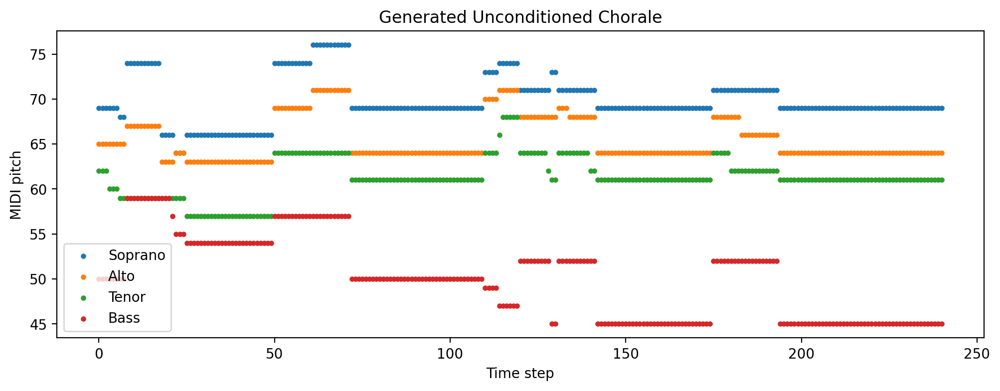

Saved MIDI: jsb_transformer_outputs\symbolic_unconditioned.mid


Saved generated MIDI: jsb_transformer_outputs\symbolic_unconditioned.mid


In [14]:
from pathlib import Path

task1_pipeline.load_checkpoint(
    "./jsb_transformer_outputs/best_task1_transformer.pt"
)


generated_seq, midi_path = task1_pipeline.generate_chorale(
    max_len=256,
    temperature=0.9,
    top_k=20,
    save_name="symbolic_unconditioned.mid",
    play=True,
)

print("Saved generated MIDI:", midi_path)

## Task2

In [20]:
class ChoraleHarmonizationTransformer(nn.Module):
    """
    Input: soprano pitch ids [B, T]
    Output: ATB token logits [B, T, atb_vocab_size]
    """
    def __init__(
        self,
        pitch_vocab_size,
        atb_vocab_size,
        pitch_pad_id,
        d_model=256,
        n_heads=4,
        n_layers=4,
        dim_feedforward=512,
        dropout=0.1,
        max_len=2048,
    ):
        super().__init__()

        self.pitch_pad_id = pitch_pad_id
        self.d_model = d_model

        self.pitch_emb = nn.Embedding(
            pitch_vocab_size,
            d_model,
            padding_idx=pitch_pad_id
        )

        self.pos_emb = PositionalEncoding(d_model, max_len=max_len)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True,
            activation="gelu",
            norm_first=True,
        )

        self.transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=n_layers,
        )

        self.ln = nn.LayerNorm(d_model)
        self.head = nn.Linear(d_model, atb_vocab_size)

    def forward(self, soprano_ids):
        """
        soprano_ids: [B, T]
        """
        key_padding_mask = soprano_ids.eq(self.pitch_pad_id)

        h = self.pitch_emb(soprano_ids) * math.sqrt(self.d_model)
        h = self.pos_emb(h)

        h = self.transformer(
            h,
            src_key_padding_mask=key_padding_mask,
        )

        h = self.ln(h)
        logits = self.head(h)

        return logits

In [21]:
class ChoraleHarmonizationPipeline:
    def __init__(
        self,
        train_dataset,
        valid_dataset,
        train_loader,
        valid_loader,
        processor,
        output_dir="./jsb_task2_outputs",
        device=None,
        d_model=256,
        n_heads=4,
        n_layers=4,
        lr=3e-4,
    ):
        self.train_dataset = train_dataset
        self.valid_dataset = valid_dataset
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.processor = processor

        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)

        self.device = device or ("cuda" if torch.cuda.is_available() else "cpu")

        self.pitch_vocab = train_dataset.pitch_vocab
        self.id_to_pitch = train_dataset.id_to_pitch
        self.atb_vocab = train_dataset.atb_vocab
        self.id_to_atb = train_dataset.id_to_atb

        self.pitch_pad_id = self.pitch_vocab[PAD]
        self.atb_pad_id = self.atb_vocab[PAD]
        self.atb_unk_id = self.atb_vocab[UNK]

        self.model = ChoraleHarmonizationTransformer(
            pitch_vocab_size=len(self.pitch_vocab),
            atb_vocab_size=len(self.atb_vocab),
            pitch_pad_id=self.pitch_pad_id,
            d_model=d_model,
            n_heads=n_heads,
            n_layers=n_layers,
            dim_feedforward=d_model * 4,
            dropout=0.1,
        ).to(self.device)

        self.optimizer = torch.optim.AdamW(
            self.model.parameters(),
            lr=lr,
            weight_decay=1e-4,
        )

        self.criterion = nn.CrossEntropyLoss(
            ignore_index=self.atb_pad_id
        )

        print("Device:", self.device)
        print("Pitch vocab size:", len(self.pitch_vocab))
        print("ATB vocab size:", len(self.atb_vocab))
        print("Model parameters:", sum(p.numel() for p in self.model.parameters()) / 1e6, "M")

    def train(self, epochs=30, save_every=5):
        best_val_loss = float("inf")

        for epoch in range(1, epochs + 1):
            train_loss = self.train_one_epoch(epoch, epochs)
            val_loss = self.evaluate()

            print(
                f"Epoch {epoch}/{epochs} | "
                f"train_loss={train_loss:.4f} | "
                f"val_loss={val_loss:.4f} | "
                f"val_ppl={math.exp(min(val_loss, 20)):.2f}"
            )

            if val_loss < best_val_loss:
                best_val_loss = val_loss
                self.save_checkpoint("best_task2_harmonization.pt")

            if epoch % save_every == 0:
                self.save_checkpoint(f"epoch_{epoch}_task2_harmonization.pt")

        self.save_checkpoint("last_task2_harmonization.pt")

    def train_one_epoch(self, epoch, total_epochs):
        self.model.train()
        losses = []

        pbar = tqdm(self.train_loader, desc=f"Task2 Train Epoch {epoch}/{total_epochs}")

        for soprano_ids, atb_ids in pbar:
            soprano_ids = soprano_ids.to(self.device)
            atb_ids = atb_ids.to(self.device)

            logits = self.model(soprano_ids)

            loss = self.criterion(
                logits.reshape(-1, logits.size(-1)),
                atb_ids.reshape(-1)
            )

            self.optimizer.zero_grad(set_to_none=True)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)

            self.optimizer.step()

            losses.append(loss.item())
            pbar.set_postfix(loss=np.mean(losses))

        return float(np.mean(losses))

    @torch.no_grad()
    def evaluate(self):
        self.model.eval()
        losses = []

        for soprano_ids, atb_ids in self.valid_loader:
            soprano_ids = soprano_ids.to(self.device)
            atb_ids = atb_ids.to(self.device)

            logits = self.model(soprano_ids)

            loss = self.criterion(
                logits.reshape(-1, logits.size(-1)),
                atb_ids.reshape(-1)
            )

            losses.append(loss.item())

        return float(np.mean(losses))

    def save_checkpoint(self, filename):
        path = self.output_dir / filename

        torch.save(
            {
                "model": self.model.state_dict(),
                "optimizer": self.optimizer.state_dict(),
                "pitch_vocab": self.pitch_vocab,
                "id_to_pitch": self.id_to_pitch,
                "atb_vocab": self.atb_vocab,
                "id_to_atb": self.id_to_atb,
                "pitch_pad_id": self.pitch_pad_id,
                "atb_pad_id": self.atb_pad_id,
            },
            path
        )

        print("Saved:", path)

    def load_checkpoint(self, path):
        ckpt = torch.load(path, map_location=self.device)
        self.model.load_state_dict(ckpt["model"])

        if "optimizer" in ckpt:
            self.optimizer.load_state_dict(ckpt["optimizer"])

        print("Loaded:", path)

    @torch.no_grad()
    def harmonize_soprano(
        self,
        soprano_ids,
        temperature=0.8,
        top_k=10,
        sample=True,
    ):
        """
        soprano_ids: LongTensor [T]
        return predicted atb_ids: LongTensor [T]
        """
        self.model.eval()

        x = soprano_ids.unsqueeze(0).to(self.device)  # [1, T]
        logits = self.model(x)[0]  # [T, atb_vocab_size]

        # 不允许生成 PAD / UNK
        logits[:, self.atb_pad_id] = -float("inf")
        logits[:, self.atb_unk_id] = -float("inf")

        if not sample:
            pred_ids = logits.argmax(dim=-1)
            return pred_ids.cpu()

        logits = logits / max(temperature, 1e-8)

        if top_k is not None:
            values, indices = torch.topk(logits, k=top_k, dim=-1)
            probs = F.softmax(values, dim=-1)

            sampled = torch.multinomial(
                probs.reshape(-1, probs.size(-1)),
                num_samples=1
            ).reshape(probs.size(0))

            pred_ids = indices[torch.arange(indices.size(0), device=self.device), sampled]
        else:
            probs = F.softmax(logits, dim=-1)
            pred_ids = torch.multinomial(probs, num_samples=1).squeeze(-1)

        return pred_ids.cpu()

    def ids_to_chorale(self, soprano_ids, atb_ids):
        seq = []

        for sid, aid in zip(soprano_ids, atb_ids):
            sid = int(sid)
            aid = int(aid)

            s = self.id_to_pitch.get(sid, -1)
            atb = self.id_to_atb.get(aid, (-1, -1, -1))

            if isinstance(s, str):
                s = -1

            if isinstance(atb, str):
                atb = (-1, -1, -1)

            chord = [
                int(s),
                int(atb[0]),
                int(atb[1]),
                int(atb[2]),
            ]
            seq.append(chord)

        return seq

    def soprano_only_chorale(self, soprano_ids):
        seq = []

        for sid in soprano_ids:
            sid = int(sid)
            s = self.id_to_pitch.get(sid, -1)

            if isinstance(s, str):
                s = -1

            seq.append([int(s), -1, -1, -1])

        return seq

    def generate_from_dataset(
        self,
        dataset,
        idx=0,
        temperature=0.8,
        top_k=10,
        sample=True,
        save_name="symbolic_conditioned.mid",
        play=True,
    ):
        soprano_ids, gt_atb_ids = dataset[idx]

        pred_atb_ids = self.harmonize_soprano(
            soprano_ids,
            temperature=temperature,
            top_k=top_k,
            sample=sample,
        )

        soprano_seq = self.soprano_only_chorale(soprano_ids)
        pred_seq = self.ids_to_chorale(soprano_ids, pred_atb_ids)
        gt_seq = self.ids_to_chorale(soprano_ids, gt_atb_ids)

        print("Generated harmonized length:", len(pred_seq))

        print("Soprano only:")
        self.processor.plot_chorale(soprano_seq, title="Condition: Soprano Melody Only")
        if play:
            self.processor.play_chorale(soprano_seq)

        print("Generated harmonization:")
        self.processor.plot_chorale(pred_seq, title="Generated Conditioned Harmonization")

        midi_path = self.output_dir / save_name
        self.processor.save_chorale_midi(pred_seq, midi_path)

        if play:
            self.processor.play_chorale(pred_seq)

        print("Ground-truth chorale:")
        self.processor.plot_chorale(gt_seq, title="Ground Truth Harmonization")
        if play:
            self.processor.play_chorale(gt_seq)

        return pred_seq, midi_path, soprano_seq, gt_seq

In [22]:
train_task2 = JSBHarmonizationDataset(processor.train)

valid_task2 = JSBHarmonizationDataset(
    processor.valid,
    pitch_vocab=train_task2.pitch_vocab,
    atb_vocab=train_task2.atb_vocab
)

test_task2 = JSBHarmonizationDataset(
    processor.test,
    pitch_vocab=train_task2.pitch_vocab,
    atb_vocab=train_task2.atb_vocab
)

train_loader_task2 = DataLoader(
    train_task2,
    batch_size=16,
    shuffle=True,
    collate_fn=lambda batch: collate_harmonization(
        batch,
        pitch_pad_id=train_task2.pitch_vocab[PAD],
        atb_pad_id=train_task2.atb_vocab[PAD],
    )
)

valid_loader_task2 = DataLoader(
    valid_task2,
    batch_size=16,
    shuffle=False,
    collate_fn=lambda batch: collate_harmonization(
        batch,
        pitch_pad_id=train_task2.pitch_vocab[PAD],
        atb_pad_id=train_task2.atb_vocab[PAD],
    )
)

print("Task 2 train samples:", len(train_task2))
print("Task 2 valid samples:", len(valid_task2))
print("Task 2 test samples:", len(test_task2))

x2, y2 = next(iter(train_loader_task2))
print("x2:", x2.shape)
print("y2:", y2.shape)

Task 2 train samples: 229
Task 2 valid samples: 76
Task 2 test samples: 77
x2: torch.Size([16, 456])
y2: torch.Size([16, 456])


In [25]:
task2_pipeline = ChoraleHarmonizationPipeline(
    train_dataset=train_task2,
    valid_dataset=valid_task2,
    train_loader=train_loader_task2,
    valid_loader=valid_loader_task2,
    processor=processor,
    output_dir="./jsb_task2_outputs",
    d_model=256,
    n_heads=4,
    n_layers=4,
    lr=1e-4,
)

task2_pipeline.train(
    epochs=100,
    save_every=100
)

C:\Users\wleun\AppData\Local\Temp\ipykernel_7248\2538254737.py:41: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.transformer = nn.TransformerEncoder(


Device: cuda
Pitch vocab size: 49
ATB vocab size: 1956
Model parameters: 3.674788 M


Task2 Train Epoch 1/100: 100%|███████████████████████████████████████████████| 15/15 [00:00<00:00, 21.59it/s, loss=7.4]


Epoch 1/100 | train_loss=7.4018 | val_loss=6.9979 | val_ppl=1094.36
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 2/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 32.75it/s, loss=6.57]


Epoch 2/100 | train_loss=6.5680 | val_loss=6.2318 | val_ppl=508.69
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 3/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 35.66it/s, loss=5.86]


Epoch 3/100 | train_loss=5.8645 | val_loss=5.7590 | val_ppl=317.03
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 4/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.20it/s, loss=5.46]


Epoch 4/100 | train_loss=5.4591 | val_loss=5.5350 | val_ppl=253.40
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 5/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 36.25it/s, loss=5.22]


Epoch 5/100 | train_loss=5.2181 | val_loss=5.4032 | val_ppl=222.12
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 6/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 35.62it/s, loss=5.06]


Epoch 6/100 | train_loss=5.0615 | val_loss=5.3000 | val_ppl=200.34
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 7/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.58it/s, loss=4.93]


Epoch 7/100 | train_loss=4.9343 | val_loss=5.2199 | val_ppl=184.91
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 8/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 33.43it/s, loss=4.84]


Epoch 8/100 | train_loss=4.8375 | val_loss=5.1511 | val_ppl=172.62
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 9/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 33.85it/s, loss=4.75]


Epoch 9/100 | train_loss=4.7467 | val_loss=5.0976 | val_ppl=163.63
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 10/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.40it/s, loss=4.66]


Epoch 10/100 | train_loss=4.6611 | val_loss=5.0506 | val_ppl=156.11
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 11/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.81it/s, loss=4.59]


Epoch 11/100 | train_loss=4.5943 | val_loss=5.0069 | val_ppl=149.44
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 12/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.93it/s, loss=4.55]


Epoch 12/100 | train_loss=4.5477 | val_loss=4.9716 | val_ppl=144.26
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 13/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 33.62it/s, loss=4.5]


Epoch 13/100 | train_loss=4.4968 | val_loss=4.9424 | val_ppl=140.11
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 14/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.50it/s, loss=4.43]


Epoch 14/100 | train_loss=4.4294 | val_loss=4.9147 | val_ppl=136.28
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 15/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 35.48it/s, loss=4.4]


Epoch 15/100 | train_loss=4.4020 | val_loss=4.8986 | val_ppl=134.10
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 16/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.40it/s, loss=4.37]


Epoch 16/100 | train_loss=4.3684 | val_loss=4.8903 | val_ppl=132.99
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 17/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.49it/s, loss=4.32]


Epoch 17/100 | train_loss=4.3228 | val_loss=4.8602 | val_ppl=129.05
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 18/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.74it/s, loss=4.3]


Epoch 18/100 | train_loss=4.2952 | val_loss=4.8555 | val_ppl=128.44
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 19/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.91it/s, loss=4.27]


Epoch 19/100 | train_loss=4.2650 | val_loss=4.8491 | val_ppl=127.62
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 20/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 35.03it/s, loss=4.23]


Epoch 20/100 | train_loss=4.2267 | val_loss=4.8500 | val_ppl=127.74


Task2 Train Epoch 21/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.64it/s, loss=4.21]


Epoch 21/100 | train_loss=4.2102 | val_loss=4.8290 | val_ppl=125.09
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 22/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 36.46it/s, loss=4.18]


Epoch 22/100 | train_loss=4.1758 | val_loss=4.8279 | val_ppl=124.95
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 23/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.57it/s, loss=4.16]


Epoch 23/100 | train_loss=4.1609 | val_loss=4.8295 | val_ppl=125.14


Task2 Train Epoch 24/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.55it/s, loss=4.14]


Epoch 24/100 | train_loss=4.1364 | val_loss=4.8176 | val_ppl=123.67
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 25/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 35.37it/s, loss=4.12]


Epoch 25/100 | train_loss=4.1179 | val_loss=4.8196 | val_ppl=123.92


Task2 Train Epoch 26/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.81it/s, loss=4.08]


Epoch 26/100 | train_loss=4.0830 | val_loss=4.8125 | val_ppl=123.04
Saved: jsb_task2_outputs\best_task2_harmonization.pt


Task2 Train Epoch 27/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.32it/s, loss=4.07]


Epoch 27/100 | train_loss=4.0666 | val_loss=4.8318 | val_ppl=125.43


Task2 Train Epoch 28/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.85it/s, loss=4.06]


Epoch 28/100 | train_loss=4.0618 | val_loss=4.8401 | val_ppl=126.49


Task2 Train Epoch 29/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.63it/s, loss=4.03]


Epoch 29/100 | train_loss=4.0341 | val_loss=4.8336 | val_ppl=125.66


Task2 Train Epoch 30/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.66it/s, loss=4.03]


Epoch 30/100 | train_loss=4.0341 | val_loss=4.8301 | val_ppl=125.22


Task2 Train Epoch 31/100: 100%|████████████████████████████████████████████████| 15/15 [00:00<00:00, 34.56it/s, loss=4]


Epoch 31/100 | train_loss=3.9993 | val_loss=4.8399 | val_ppl=126.46


Task2 Train Epoch 32/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.01it/s, loss=3.97]


Epoch 32/100 | train_loss=3.9692 | val_loss=4.8317 | val_ppl=125.42


Task2 Train Epoch 33/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 35.35it/s, loss=3.96]


Epoch 33/100 | train_loss=3.9622 | val_loss=4.8508 | val_ppl=127.84


Task2 Train Epoch 34/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.94it/s, loss=3.94]


Epoch 34/100 | train_loss=3.9397 | val_loss=4.8442 | val_ppl=127.00


Task2 Train Epoch 35/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.59it/s, loss=3.93]


Epoch 35/100 | train_loss=3.9302 | val_loss=4.8591 | val_ppl=128.91


Task2 Train Epoch 36/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.48it/s, loss=3.91]


Epoch 36/100 | train_loss=3.9068 | val_loss=4.8648 | val_ppl=129.65


Task2 Train Epoch 37/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.53it/s, loss=3.89]


Epoch 37/100 | train_loss=3.8869 | val_loss=4.8636 | val_ppl=129.49


Task2 Train Epoch 38/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 35.07it/s, loss=3.88]


Epoch 38/100 | train_loss=3.8782 | val_loss=4.8512 | val_ppl=127.90


Task2 Train Epoch 39/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.52it/s, loss=3.86]


Epoch 39/100 | train_loss=3.8580 | val_loss=4.8686 | val_ppl=130.13


Task2 Train Epoch 40/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.66it/s, loss=3.84]


Epoch 40/100 | train_loss=3.8353 | val_loss=4.8791 | val_ppl=131.51


Task2 Train Epoch 41/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.90it/s, loss=3.82]


Epoch 41/100 | train_loss=3.8208 | val_loss=4.8920 | val_ppl=133.22


Task2 Train Epoch 42/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.85it/s, loss=3.82]


Epoch 42/100 | train_loss=3.8192 | val_loss=4.9205 | val_ppl=137.08


Task2 Train Epoch 43/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.09it/s, loss=3.81]


Epoch 43/100 | train_loss=3.8127 | val_loss=4.8880 | val_ppl=132.68


Task2 Train Epoch 44/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.29it/s, loss=3.81]


Epoch 44/100 | train_loss=3.8116 | val_loss=4.9006 | val_ppl=134.38


Task2 Train Epoch 45/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 31.95it/s, loss=3.75]


Epoch 45/100 | train_loss=3.7548 | val_loss=4.9164 | val_ppl=136.52


Task2 Train Epoch 46/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.16it/s, loss=3.75]


Epoch 46/100 | train_loss=3.7549 | val_loss=4.9103 | val_ppl=135.69


Task2 Train Epoch 47/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.53it/s, loss=3.72]


Epoch 47/100 | train_loss=3.7234 | val_loss=4.9248 | val_ppl=137.66


Task2 Train Epoch 48/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.39it/s, loss=3.71]


Epoch 48/100 | train_loss=3.7144 | val_loss=4.9264 | val_ppl=137.88


Task2 Train Epoch 49/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.48it/s, loss=3.71]


Epoch 49/100 | train_loss=3.7096 | val_loss=4.9532 | val_ppl=141.63


Task2 Train Epoch 50/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.98it/s, loss=3.69]


Epoch 50/100 | train_loss=3.6866 | val_loss=4.9468 | val_ppl=140.73


Task2 Train Epoch 51/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.79it/s, loss=3.68]


Epoch 51/100 | train_loss=3.6836 | val_loss=4.9468 | val_ppl=140.73


Task2 Train Epoch 52/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.15it/s, loss=3.65]


Epoch 52/100 | train_loss=3.6518 | val_loss=4.9583 | val_ppl=142.35


Task2 Train Epoch 53/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.98it/s, loss=3.65]


Epoch 53/100 | train_loss=3.6482 | val_loss=4.9811 | val_ppl=145.63


Task2 Train Epoch 54/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.45it/s, loss=3.65]


Epoch 54/100 | train_loss=3.6510 | val_loss=4.9788 | val_ppl=145.30


Task2 Train Epoch 55/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.79it/s, loss=3.61]


Epoch 55/100 | train_loss=3.6080 | val_loss=4.9919 | val_ppl=147.22


Task2 Train Epoch 56/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.73it/s, loss=3.62]


Epoch 56/100 | train_loss=3.6192 | val_loss=4.9882 | val_ppl=146.67


Task2 Train Epoch 57/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.78it/s, loss=3.61]


Epoch 57/100 | train_loss=3.6082 | val_loss=4.9942 | val_ppl=147.55


Task2 Train Epoch 58/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.39it/s, loss=3.6]


Epoch 58/100 | train_loss=3.6011 | val_loss=5.0100 | val_ppl=149.90


Task2 Train Epoch 59/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.06it/s, loss=3.6]


Epoch 59/100 | train_loss=3.5971 | val_loss=5.0323 | val_ppl=153.28


Task2 Train Epoch 60/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.59it/s, loss=3.58]


Epoch 60/100 | train_loss=3.5761 | val_loss=5.0212 | val_ppl=151.59


Task2 Train Epoch 61/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.72it/s, loss=3.55]


Epoch 61/100 | train_loss=3.5476 | val_loss=5.0426 | val_ppl=154.87


Task2 Train Epoch 62/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.92it/s, loss=3.54]


Epoch 62/100 | train_loss=3.5429 | val_loss=5.0538 | val_ppl=156.62


Task2 Train Epoch 63/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.27it/s, loss=3.52]


Epoch 63/100 | train_loss=3.5154 | val_loss=5.0565 | val_ppl=157.04


Task2 Train Epoch 64/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.33it/s, loss=3.53]


Epoch 64/100 | train_loss=3.5281 | val_loss=5.0600 | val_ppl=157.59


Task2 Train Epoch 65/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.24it/s, loss=3.51]


Epoch 65/100 | train_loss=3.5077 | val_loss=5.0675 | val_ppl=158.77


Task2 Train Epoch 66/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 33.48it/s, loss=3.5]


Epoch 66/100 | train_loss=3.4968 | val_loss=5.0854 | val_ppl=161.64


Task2 Train Epoch 67/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.34it/s, loss=3.47]


Epoch 67/100 | train_loss=3.4674 | val_loss=5.0942 | val_ppl=163.08


Task2 Train Epoch 68/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.66it/s, loss=3.46]


Epoch 68/100 | train_loss=3.4614 | val_loss=5.0863 | val_ppl=161.78


Task2 Train Epoch 69/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.84it/s, loss=3.44]


Epoch 69/100 | train_loss=3.4357 | val_loss=5.1081 | val_ppl=165.36


Task2 Train Epoch 70/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.69it/s, loss=3.43]


Epoch 70/100 | train_loss=3.4308 | val_loss=5.1178 | val_ppl=166.96


Task2 Train Epoch 71/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.72it/s, loss=3.42]


Epoch 71/100 | train_loss=3.4161 | val_loss=5.1312 | val_ppl=169.21


Task2 Train Epoch 72/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.83it/s, loss=3.42]


Epoch 72/100 | train_loss=3.4206 | val_loss=5.1393 | val_ppl=170.59


Task2 Train Epoch 73/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.17it/s, loss=3.41]


Epoch 73/100 | train_loss=3.4056 | val_loss=5.1591 | val_ppl=174.01


Task2 Train Epoch 74/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.72it/s, loss=3.41]


Epoch 74/100 | train_loss=3.4051 | val_loss=5.1645 | val_ppl=174.96


Task2 Train Epoch 75/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.81it/s, loss=3.37]


Epoch 75/100 | train_loss=3.3744 | val_loss=5.1606 | val_ppl=174.27


Task2 Train Epoch 76/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.53it/s, loss=3.36]


Epoch 76/100 | train_loss=3.3582 | val_loss=5.1751 | val_ppl=176.82


Task2 Train Epoch 77/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.17it/s, loss=3.35]


Epoch 77/100 | train_loss=3.3454 | val_loss=5.1806 | val_ppl=177.79


Task2 Train Epoch 78/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 35.00it/s, loss=3.35]


Epoch 78/100 | train_loss=3.3532 | val_loss=5.1864 | val_ppl=178.83


Task2 Train Epoch 79/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.65it/s, loss=3.34]


Epoch 79/100 | train_loss=3.3357 | val_loss=5.2045 | val_ppl=182.08


Task2 Train Epoch 80/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 31.14it/s, loss=3.32]


Epoch 80/100 | train_loss=3.3198 | val_loss=5.2156 | val_ppl=184.13


Task2 Train Epoch 81/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.18it/s, loss=3.28]


Epoch 81/100 | train_loss=3.2847 | val_loss=5.2197 | val_ppl=184.88


Task2 Train Epoch 82/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.66it/s, loss=3.29]


Epoch 82/100 | train_loss=3.2875 | val_loss=5.2469 | val_ppl=189.98


Task2 Train Epoch 83/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.47it/s, loss=3.28]


Epoch 83/100 | train_loss=3.2789 | val_loss=5.2515 | val_ppl=190.86


Task2 Train Epoch 84/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.89it/s, loss=3.28]


Epoch 84/100 | train_loss=3.2799 | val_loss=5.2486 | val_ppl=190.31


Task2 Train Epoch 85/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 34.82it/s, loss=3.26]


Epoch 85/100 | train_loss=3.2570 | val_loss=5.2705 | val_ppl=194.51


Task2 Train Epoch 86/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.74it/s, loss=3.25]


Epoch 86/100 | train_loss=3.2501 | val_loss=5.2921 | val_ppl=198.75


Task2 Train Epoch 87/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.78it/s, loss=3.25]


Epoch 87/100 | train_loss=3.2468 | val_loss=5.2878 | val_ppl=197.92


Task2 Train Epoch 88/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.88it/s, loss=3.23]


Epoch 88/100 | train_loss=3.2305 | val_loss=5.2896 | val_ppl=198.27


Task2 Train Epoch 89/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.80it/s, loss=3.22]


Epoch 89/100 | train_loss=3.2220 | val_loss=5.2997 | val_ppl=200.27


Task2 Train Epoch 90/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 33.58it/s, loss=3.2]


Epoch 90/100 | train_loss=3.1966 | val_loss=5.3165 | val_ppl=203.67


Task2 Train Epoch 91/100: 100%|██████████████████████████████████████████████| 15/15 [00:00<00:00, 34.19it/s, loss=3.2]


Epoch 91/100 | train_loss=3.2006 | val_loss=5.3332 | val_ppl=207.10


Task2 Train Epoch 92/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.67it/s, loss=3.19]


Epoch 92/100 | train_loss=3.1891 | val_loss=5.3466 | val_ppl=209.90


Task2 Train Epoch 93/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 31.37it/s, loss=3.19]


Epoch 93/100 | train_loss=3.1918 | val_loss=5.3431 | val_ppl=209.17


Task2 Train Epoch 94/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.24it/s, loss=3.17]


Epoch 94/100 | train_loss=3.1738 | val_loss=5.3442 | val_ppl=209.40


Task2 Train Epoch 95/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.61it/s, loss=3.16]


Epoch 95/100 | train_loss=3.1590 | val_loss=5.3650 | val_ppl=213.80


Task2 Train Epoch 96/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 31.84it/s, loss=3.15]


Epoch 96/100 | train_loss=3.1491 | val_loss=5.3750 | val_ppl=215.93


Task2 Train Epoch 97/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.86it/s, loss=3.13]


Epoch 97/100 | train_loss=3.1273 | val_loss=5.4033 | val_ppl=222.13


Task2 Train Epoch 98/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 32.92it/s, loss=3.11]


Epoch 98/100 | train_loss=3.1106 | val_loss=5.4000 | val_ppl=221.41


Task2 Train Epoch 99/100: 100%|█████████████████████████████████████████████| 15/15 [00:00<00:00, 33.32it/s, loss=3.12]


Epoch 99/100 | train_loss=3.1184 | val_loss=5.4076 | val_ppl=223.10


Task2 Train Epoch 100/100: 100%|████████████████████████████████████████████| 15/15 [00:00<00:00, 32.12it/s, loss=3.09]


Epoch 100/100 | train_loss=3.0935 | val_loss=5.4012 | val_ppl=221.68
Saved: jsb_task2_outputs\epoch_100_task2_harmonization.pt
Saved: jsb_task2_outputs\last_task2_harmonization.pt


Loaded: ./jsb_task2_outputs/best_task2_harmonization.pt
Generated harmonized length: 196
Soprano only:


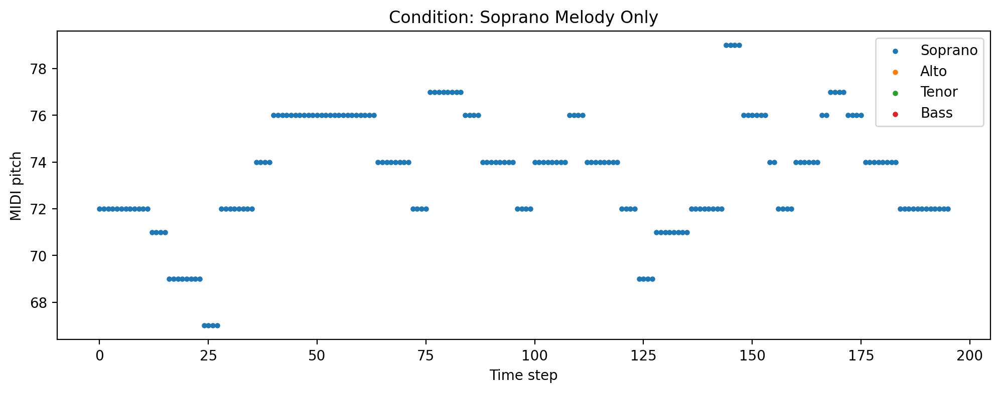

Generated harmonization:


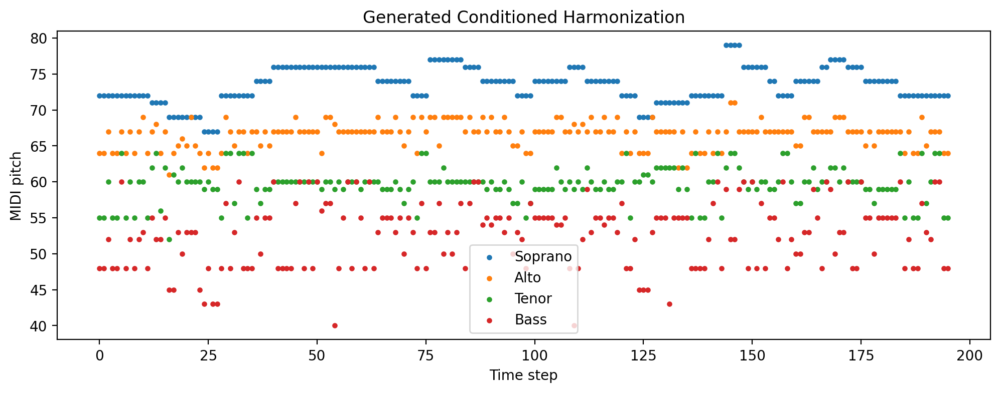

Saved MIDI: jsb_task2_outputs\symbolic_conditioned.mid


Ground-truth chorale:


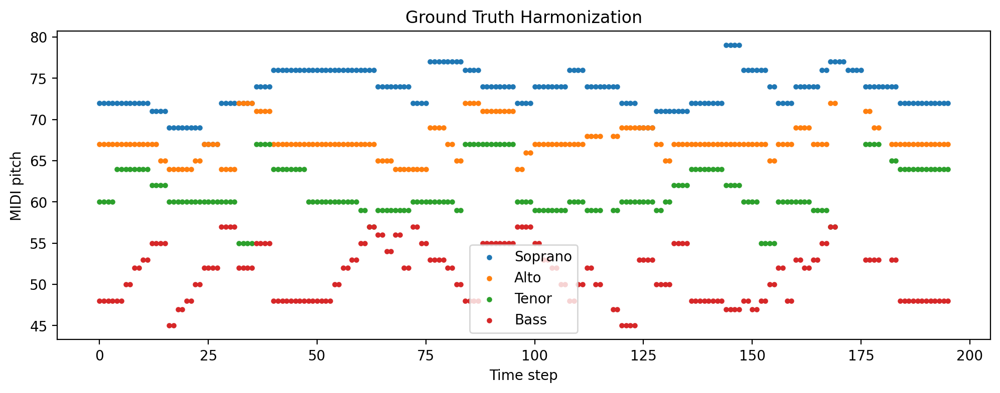

Saved generated MIDI: jsb_task2_outputs\symbolic_conditioned.mid


In [29]:
task2_pipeline.load_checkpoint(
    "./jsb_task2_outputs/best_task2_harmonization.pt"
)

pred_seq, midi_path, soprano_seq, gt_seq = task2_pipeline.generate_from_dataset(
    dataset=valid_task2,
    idx=0,
    temperature=0.8,
    top_k=10,
    sample=True,
    save_name="symbolic_conditioned.mid",
    play=True,
)

print("Saved generated MIDI:", midi_path)